In [1]:
%reload_ext autoreload
%autoreload 2
%reload_ext watermark
%watermark -v -p numpy,pandas,pycocotools,torch,torchvision,detectron2,cv2

CPython 3.6.9
IPython 7.16.1

numpy 1.19.4
pandas 1.1.5
pycocotools not installed
torch 1.8.0.dev20210103+cu101
torchvision 0.9.0.dev20210103+cu101
detectron2 0.1
cv2 4.5.1


In [2]:
import os, sys
import numpy as np
import cv2
import random
import PIL.Image as Image
import torch, torchvision
import shutil 
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
from IPython.display import display, HTML


%matplotlib inline
%config InlineBackend.figure_format='retina'
%config IPCompleter.use_jedi = False

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED);

In [3]:
display(HTML('<style>.container { width:%d%% !important; }</style>' % 90))

----------------------------

## Plate Detection Using Yolov5 (车牌提取)

### Dataset

[CCPD2019](https://github.com/detectRecog/CCPD)

[BaiduYun Drive(code: ol3j)](https://pan.baidu.com/s/1JSpc9BZXFlPkXxRK4qUCyw)

In [4]:
data_root = '/data/datasets/cv/CCPD2019'

!ls $data_root $data_root/splits

/data/datasets/cv/CCPD2019:
CCPD2019.tar.gz  ccpd_base	 ccpd_db  ccpd_rotate	images
LICENSE		 ccpd_blur	 ccpd_fn  ccpd_tilt	labels
README.md	 ccpd_challenge  ccpd_np  ccpd_weather	splits

/data/datasets/cv/CCPD2019/splits:
ccpd_blur.txt	    ccpd_db.txt  ccpd_rotate.txt  test.txt   val.txt
ccpd_challenge.txt  ccpd_fn.txt  ccpd_tilt.txt	  train.txt


In [5]:
%%bash

mkdir -p /data/codes

if [[ ! -d /data/codes/yolov5 ]]
then
    git clone https://github.com/ultralytics/yolov5 /data/codes/yolov5
    cd /data/codes/yolov5 && pip3 install -r requirements.txt > /dev/null
fi

### Data Preprocess

In [6]:
def read_data(phase):
    with open(os.path.join(data_root, 'splits', f'{phase}.txt')) as fr:
        # data = fr.readlines()
        data = fr.read().splitlines()
    return data

In [7]:
test_data = read_data('test')
test_data[-6]

'ccpd_tilt/1128-27_21-97&485_423&774-409&774_97&611_111&485_423&648-0_0_32_32_5_31_27-121-271.jpg'

In [8]:
provinces = ["皖", "沪", "津", "渝", "冀", "晋", "蒙", "辽", "吉", "黑", "苏", "浙", "京", "闽", "赣", "鲁", "豫", 
             "鄂", "湘", "粤", "桂", "琼", "川", "贵", "云", "藏", "陕", "甘", "青", "宁", "新", "警", "学", "O"]

alphabets = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U',
             'V', 'W', 'X', 'Y', 'Z', 'O']

ads = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'U', 'V',
       'W', 'X', 'Y', 'Z', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'O']

```
                           97&485_423&774
                      | {left up}_{right bottom}
                      |
   0         1        |   2                   3                         4               5            6
{area}-{tilt degree}-{bounding box}-{four vertices locations}-{license plate number}-{brightness}-{blurriness}
        |                                                       |
        | {horizontal tilt degree}_{vertical_tilt_degree}       |
                                27_21                           | {provinces}_{alphabets}_{ads}
                                                                         0_0_32_32_5_31_27
```

In [9]:
def parse_bbox_and_lpn(filename):
    segs = filename.split('-')
    bbox_vertices = segs[2].split('_')
    bbox_left_up = [int(x) for x in bbox_vertices[0].split('&')]
    bbox_right_bottom = [int(x) for x in bbox_vertices[1].split('&')]
    lps = [int(x) for x in segs[4].split('_')]
    return bbox_left_up, bbox_right_bottom, lps

def lpn_index2name(lpn):
    if len(lpn) != 7:
        raise
    return [provinces[lpn[0]]] + [alphabets[lpn[1]]] + [ads[lpn[i]] for i in range(2, 7)]

In [10]:
x1y1, x2y2, lpn = parse_bbox_and_lpn(test_data[-6])
x1y1, x2y2, lpn

([97, 485], [423, 774], [0, 0, 32, 32, 5, 31, 27])

In [11]:
x1y1, x2y2, lpn_index2name(lpn)

([97, 485], [423, 774], ['皖', 'A', '8', '8', 'F', '7', '3'])

#### Visualize Single Sample 

In [12]:
sample_image_file = os.path.join(data_root, test_data[-6])
sample_image_rgb = cv2.cvtColor(cv2.imread(sample_image_file), cv2.COLOR_BGR2RGB)
image_height, image_width = sample_image_rgb.shape[0:2]
image_height, image_width

(1160, 720)

In [13]:
sample_image_box = cv2.rectangle(sample_image_rgb, tuple(x1y1), tuple(x2y2), (0, 255, 0), 2)

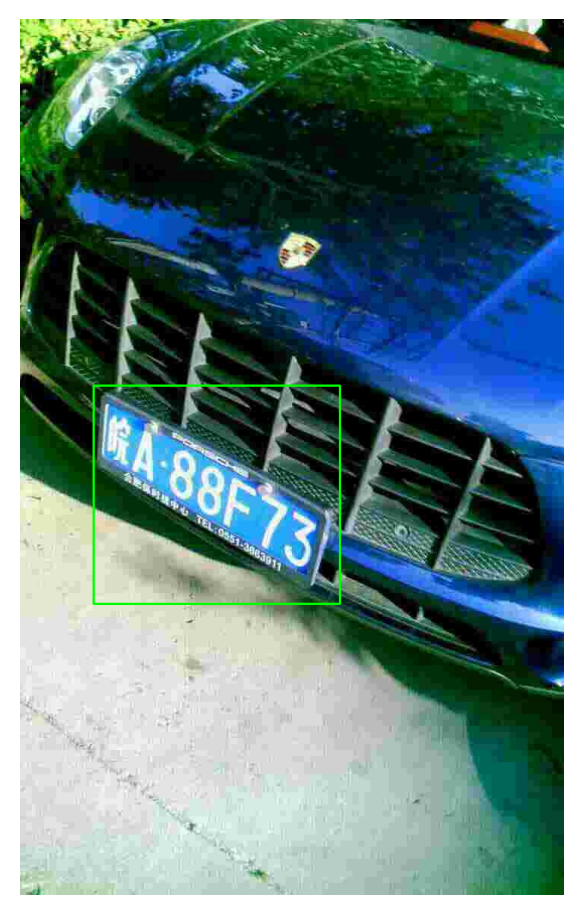

In [14]:
dpi = 100
fig_w, fig_h = 0.5*image_width/dpi, 0.5*image_height/dpi
plt.figure(figsize=(fig_w, fig_h), dpi=dpi)
plt.imshow(sample_image_box)
plt.axis('off');

#### Visualize Subplots Sample 

[SimHei Font: qsxp](https://pan.baidu.com/s/1AkoHvYbCYgLSJZDrCVv8RA "提取码: qsxp")

In [15]:
zh_font = FontProperties(fname='/data/font/simhei.ttf', size=14)

def visualize_data_subplots(rows, cols, images, titles=None, gray=False, resize=None, dpi=100):
    
    if isinstance(images[0], str):
        max_h, max_w = 0.8*rows*dpi, 0.8*cols*dpi
    else:
        max_h = max([ x.shape[0] for x in images])
        max_w = max([ x.shape[1] for x in images])
    figsize = (5 * int(max_w / dpi + 1), 5 * int(max_h / dpi + 1))
    fig = plt.figure(figsize=figsize, dpi=dpi)
    if titles is None:
        titles = [str(i) for i in range(1, len(images) + 1)]
    for i in range(rows * cols):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.set_title(titles[i], fontproperties=zh_font)
        # plt.xticks([])
        # plt.yticks([])
        plt.axis(False)
        img = images[i]
        if isinstance(img, str):
            img = cv2.imread(img)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img = img / 255
        if resize:
            if isinstance(resize, int):
                resize = (resize, resize)
            img = cv2.resize(img, resize)
        if gray:
            plt.imshow(img, cmap=plt.cm.gray)
        else: 
            plt.imshow(img)
    plt.tight_layout()
    
def imshow(img, figsize=(8, 8), gray=False, isbgr=False):
    plt.figure(figsize=figsize)
    plt.axis('off')
    if isbgr:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGBA)
    if gray:
        plt.imshow(img, cmap=plt.cm.gray)
    else:
        plt.imshow(img)

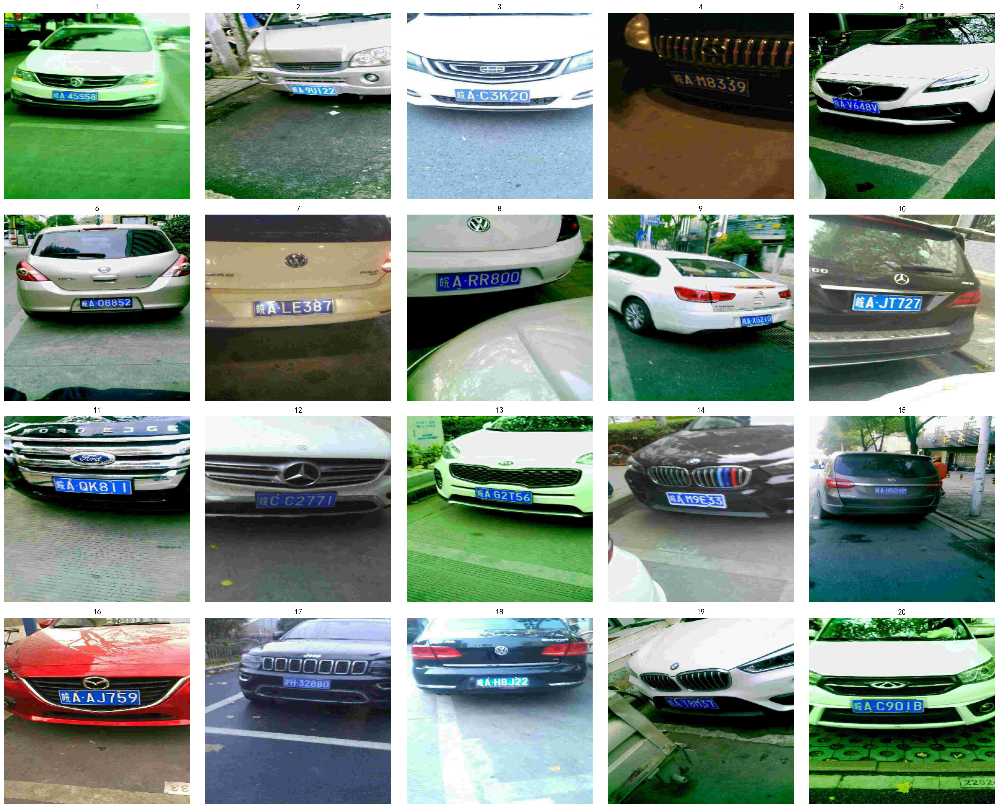

In [16]:
rows, cols = 4, 5
train_data = read_data('train')
images_sample_list = [os.path.join(data_root, train_data[i]) for i in range(cols*rows)]

visualize_data_subplots(rows, cols, images_sample_list, resize=(300, 300), dpi=80)

#### Data Convert to Yolov5 

In [17]:
def yolo_data_generate(phase, num=-1, force=False):
    # prepare data path
    phase_images_path = os.path.join(data_root, 'images', phase)
    phase_labels_path = os.path.join(data_root, 'labels', phase)
    if os.path.exists(phase_images_path) and \
        os.path.exists(phase_labels_path) and \
            not force:
                print(f'{phase} already exist')
                return
    os.makedirs(phase_images_path, exist_ok=True)
    os.makedirs(phase_labels_path, exist_ok=True)
    
    # parse file and format convert
    files_list = read_data(phase)
    if num > 0:
        files_list = files_list[:num]
    for filepath in files_list:
        basename = os.path.basename(filepath)
        image_src_path = os.path.join(data_root, filepath)
        image_dst_path = os.path.join(phase_images_path, basename)
        label_dst_path = os.path.join(phase_labels_path, basename.split('.')[0] + '.txt')
        x1y1, x2y2, _ = parse_bbox_and_lpn(basename)
        image_bgr = cv2.imread(image_src_path)
        bbox = yolo_normal_convert(image_bgr.shape[1], image_bgr.shape[0], *x1y1, *x2y2)
        ## generate label file
        with open(label_dst_path, 'w') as fw:
            fw.write('0 %.6f %.6f %.6f %.6f' % bbox)
        ## copy image file
        shutil.copy(image_src_path, image_dst_path)

In [18]:
yolo_data_generate('train', force=False)
yolo_data_generate('val', num=1000, force=False)
# yolo_data_generate('test', force=False)

train already exist
val already exist


In [19]:
def yolo_normal_convert(width, height, x1, y1, x2, y2):
    dw, dh = 1.0 / width, 1.0 / height
    bw, bh = (x2 - x1), (y2 - y1)
    cx, cy = (x1 + x2) / 2.0 - 1, (y1 + y2) / 2.0 - 1
    return round(cx * dw, 6), round(cy * dh, 6), round(bw * dw, 6), round(bh * dh, 6)
yolo_normal_convert(200, 200, 0, 0, 200, 200)

(0.495, 0.495, 1.0, 1.0)

### Yolov5 Train 

#### GPU Info

In [20]:
!nvidia-smi

Wed Apr  7 18:19:04 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P40           Off  | 00000000:00:06.0 Off |                    0 |
| N/A   28C    P0    44W / 250W |      0MiB / 22919MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

#### Download Yolov5 Codes

In [21]:
%%bash

mkdir -p /data/codes

export YOLOV5_ROOT=/data/codes/yolov5

if [[ ! -d $YOLOV5_ROOT ]]
then
    git clone https://github.com/ultralytics/yolov5 $YOLOV5_ROOT
    cd $YOLOV5_ROOT && pip3 install -r requirements.txt > /dev/null
fi

#### Setup Configure Files

- `${YOLOV5_ROOT}/data/CCPD2019/dataset.yaml`

> ```yaml
> train: /data/datasets/cv/CCPD2019/images/train   
> val: /data/datasets/cv/CCPD2019/images/val   
> 
> nc: 1
> 
> names: ['licenseplates']
> ```


- `${YOLOV5_ROOT}/data/CCPD2019/hyperparameters.yaml`

>```yaml
> lr0: 0.01  # initial learning rate (SGD=1E-2, Adam=1E-3)  
> lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)   
> momentum: 0.937  # SGD momentum/Adam beta1  
> weight_decay: 0.0005  # optimizer weight decay 5e-4  
> warmup_epochs: 3.0  # warmup epochs (fractions ok)   
> warmup_momentum: 0.8  # warmup initial momentum
> warmup_bias_lr: 0.1  # warmup initial bias lr
> box: 0.05  # box loss gain
> cls: 0.5  # cls loss gain
> cls_pw: 1.0  # cls BCELoss positive_weight
> obj: 1.0  # obj loss gain (scale with pixels)
> obj_pw: 1.0  # obj BCELoss positive_weight
> iou_t: 0.20  # IoU training threshold
> anchor_t: 4.0  # anchor-multiple threshold
> # anchors: 3  # anchors per output layer (0 to ignore)
> fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
> hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
> hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
> hsv_v: 0.4  # image HSV-Value augmentation (fraction)
> degrees: 0.0  # image rotation (+/- deg)
> translate: 0.1  # image translation (+/- fraction)
> scale: 0.5  # image scale (+/- gain)
> shear: 0.0  # image shear (+/- deg)
> perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
> flipud: 0.0  # image flip up-down (probability)
> fliplr: 0.5  # image flip left-right (probability)
> mosaic: 1.0  # image mosaic (probability)
> mixup: 0.0  # image mixup (probability)
> ```


- `${YOLOV5_ROOT}/data/CCPD2019/yolov5s.yaml`

> ```yaml
> # parameters
> nc: 1  # number of classes
> depth_multiple: 0.33  # model depth multiple
> width_multiple: 0.50  # layer channel multiple
> 
> # anchors
> anchors:
>   - [10,13, 16,30, 33,23]  # P3/8
>   - [30,61, 62,45, 59,119]  # P4/16
>   - [116,90, 156,198, 373,326]  # P5/32
> 
> # YOLOv5 backbone
> backbone:
>   # [from, number, module, args]
>   [[-1, 1, Focus, [64, 3]],  # 0-P1/2
>    [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
>    [-1, 3, BottleneckCSP, [128]],
>    [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
>    [-1, 9, BottleneckCSP, [256]],
>    [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
>    [-1, 9, BottleneckCSP, [512]],
>    [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
>    [-1, 1, SPP, [1024, [5, 9, 13]]],
>    [-1, 3, BottleneckCSP, [1024, False]],  # 9
>   ]
> 
> # YOLOv5 head
> head:
>   [[-1, 1, Conv, [512, 1, 1]],
>    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
>    [[-1, 6], 1, Concat, [1]],  # cat backbone P4
>    [-1, 3, BottleneckCSP, [512, False]],  # 13
> 
>    [-1, 1, Conv, [256, 1, 1]],
>    [-1, 1, nn.Upsample, [None, 2, 'nearest']],
>    [[-1, 4], 1, Concat, [1]],  # cat backbone P3
>    [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)
> 
>    [-1, 1, Conv, [256, 3, 2]],
>    [[-1, 14], 1, Concat, [1]],  # cat head P4
>    [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)
> 
>    [-1, 1, Conv, [512, 3, 2]],
>    [[-1, 10], 1, Concat, [1]],  # cat head P5
>    [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)
> 
>    [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
>   ]
> ```

#### Execute Bash Script (DDP)

edit `$YOLOV5_ROOT/data/CCPD2019/train.sh`

```bash

#!/bin/bash

prog_name=$(basename $0)
master_addr=10.255.0.58
master_port=8555
nodes_num=1
procs_num=1
node_index=0
batch_size=96
ddp=False
level=s
out_dir=/data/result/CCPD2019

__usage() {
    echo ""
    echo "${prog_name} arguments:"
    echo "-m or --master master_addr:master_port"
    echo "-n or --nodes node/nnodes like 1/3"
    echo "-p or --procs num"
    echo "-l or --level"
    echo "-b or --bs batchsize"
    echo "-o or --output"
    echo "-h or --help"
    echo ""
}

ARGUMENT_LIST=(
    "master"
    "nodes"
    "procs"
    "level"
    "out"
    "bs"
)

opts=$(getopt \
    --options "$(printf "%.1s:" "${ARGUMENT_LIST[@]}")h::" \
    --longoptions "$(printf "%s:," "${ARGUMENT_LIST[@]}")help::" \
    --name "$prog_name" \
    -- "$@"
)

eval set --$opts

while [[ $# -gt 0 ]]; do
    case "$1" in
        -o|--out)
            out_dir=$2
            shift 2
            ;;

        -m|--master)
            ddp=True
            master_addr=`echo $2 | cut -d: -f1`
            master_port=`echo $2 | cut -d: -f2`
            shift 2
            ;;

        -n|--nodes)
            ddp=True
            nodes_num=`echo $2 | cut -d/ -f2`
            node=`echo $2 | cut -d/ -f1`
            node_index=`expr $node - 1`
            shift 2
            ;;

        -p|--procs)
            ddp=True
            procs_num=$2
            shift 2
            ;;

        -l|--level)
            ddp=True
            level=$2
            shift 2
            ;;

        -b|--bs)
            batch_size=$2
            shift 2
            ;;

        -h|--help)
            __usage && exit 1
            ;;

        *)
            break
            ;;
    esac
done

batch_size=`expr $batch_size \* $nodes_num`
data_root=data/CCPD2019

commargs="--img-size 640 --batch-size $batch_size --epochs 30 --device 0 \
    --workers 4 --project $out_dir --name $level --exist-ok \
    --data $data_root/dataset.yaml \
    --cfg $data_root/yolov5$level.yaml \
    --hyp $data_root/hyperparameters.yaml \
    --weights 'weights/yolov5$level.pt'"

__kill_resource() {
    pid=`ps -eo pid,args | grep "train.py" | grep -v "grep" | cut -c 1-6`
    if [[ x$pid != x ]]
    then
        echo "kill $pid"
        kill -9 $pid
    fi
}

__kill_resource

if [[ x$ddp == xTrue ]]
then
    echo "DDP run $batch_size"
    python3 -m torch.distributed.launch \
        --nproc_per_node=$procs_num --nnodes=$nodes_num --node=$node_index \
        --master_addr $master_addr --master_port $master_port \
        train.py $commargs
else
    python3 train.py $commargs
fi

__kill_resource

```

#### Start Train

Run `train.sh` in the `$YOLOV5_ROOT`.

A. Single Machine

```bash
./data/CCPD2019/train.sh --bs 64 --out /data/result/CCPD2019
```

B. Multiple GPUs (DDP), eg: I have 3 gpu machines

> node-1 (master)
> ```bash
> ./data/CCPD2019/train.sh --level s --bs 64 --out /data/result/CCPD2019 --nodes 1/3
> ```

> node-2
> ```bash
> ./data/CCPD2019/train.sh --level s --bs 64 --out /data/result/CCPD2019 --nodes 2/3
> ```


> node-3
> ```bash
> ./data/CCPD2019/train.sh --level s --bs 64 --out /data/result/CCPD2019 --nodes 3/3
> ```

#### Train Result

`tree /data/result/CCPD2019 `

> ```
> /data/result/CCPD2019/weights/
> ├── best.pt
> └── last.pt
> ```

### Yolov5 Detect

In [ ]:
# add syspath
WEIGHTS_PATH = '/data/result/CCPD2019/weights/last.pt'
IMAGE_SIZE = 512

YOLOV5_ROOT = '/data/codes/yolov5'
PYYOLO_PATH = os.path.dirname(YOLOV5_ROOT)
import sys
if PYYOLO_PATH not in sys.path: 
    sys.path.append(PYYOLO_PATH)
    sys.path.append(YOLOV5_ROOT)
    
# import yolov5
from yolov5.models.experimental import attempt_load
from yolov5.utils.torch_utils import select_device
from yolov5.utils.datasets import LoadImages
from yolov5.utils.general import check_img_size, non_max_suppression
from yolov5.utils.general import scale_coords
from yolov5.utils.plots import plot_one_box

# detect
device = select_device(device='0')
model = attempt_load(WEIGHTS_PATH, map_location=device)
imgsz = check_img_size(IMAGE_SIZE, s=model.stride.max())
model = model.half() # amp

conf_thres = 0.35
iou_thres = 0.45

images_predbox_list = []
for img_path in images_sample_list:
    dataset = LoadImages(img_path, img_size=imgsz)
    path, img, im0, _ = next(iter(dataset))
    img = torch.from_numpy(img).to(device)
    img = img.half() / 255.0
    if img.ndimension() == 3:
        img = img.unsqueeze(0)
    pred = model(img, augment=False)[0]
    pred = non_max_suppression(pred, conf_thres, iou_thres)
    for i, det in enumerate(pred):
        if len(det) == 0:
            print(f'{path} is not detect pl')
            continue
        det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()
        for *xyxy, conf, cls in reversed(det):
            images_predbox_list.append({
                'image_path': img_path,
                'pred_box': [int(x) for x in xyxy]
            })
            break # we only using first best for test
            
# print result
for jitem in images_predbox_list:
    imgpath = jitem['image_path']
    predbox = jitem['pred_box']
    print(os.path.basename(imgpath).split('-')[2], predbox)

In [ ]:
images_cropped_list = []
for jitem in images_predbox_list:
    imgpath = jitem['image_path']
    x1, y1, x2, y2 = jitem['pred_box']
    img = cv2.imread(imgpath)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images_cropped_list.append(img[y1:y2, x1:x2, :])

In [ ]:
visualize_data_subplots(rows, cols, images_cropped_list)

## Character Segmentation (字符提取)

ANPR: Automatic License/Number Plate Recognition

In [ ]:
image_bbox_cropped = images_cropped_list[5]
plt.figure(figsize=(12, 8), dpi=100)
plt.imshow(image_bbox_cropped)
plt.axis('off');

### Image Processing 

#### Changing Gray Colorspace (reduce value)

In [ ]:
image_bbox_gray = cv2.cvtColor(image_bbox_cropped, cv2.COLOR_RGB2GRAY)
imshow(image_bbox_gray, gray=True)

#### Image Smoothing (reduce noise)

In [ ]:
ksize = 5
image_bbox_blurs = {
    'average_f': cv2.blur(image_bbox_gray, (ksize, ksize)),
    'gaussian_f': cv2.GaussianBlur(image_bbox_gray, (ksize, ksize), 0),
    'median_f': cv2.medianBlur(image_bbox_gray, ksize),
    'bilateral_f': cv2.bilateralFilter(image_bbox_gray, 9, 75, 75)

}

visualize_data_subplots(1, len(image_bbox_blurs),
                        list(image_bbox_blurs.values()),
                        list(image_bbox_blurs.keys()),
                        gray=True)

#### Image Thresholding

In [ ]:
image_bbox_binarys = {}
for title, blur_img in image_bbox_blurs.items():
    image_bbox_binarys[f'{title}_global_t'] = cv2.threshold(
        blur_img, 127, 255, cv2.THRESH_BINARY)[1]
    image_bbox_binarys[f'{title}_adaptive_mean_t'] =  cv2.adaptiveThreshold(
        blur_img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    image_bbox_binarys[f'{title}_adaptive_gaussian_t'] = cv2.adaptiveThreshold(
        blur_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    image_bbox_binarys[f'{title}_Otsu\'s_t'] = cv2.threshold(
        blur_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

visualize_data_subplots(len(image_bbox_blurs),
                        int(len(image_bbox_binarys) / len(image_bbox_blurs)),
                        list(image_bbox_binarys.values()),
                        list(image_bbox_binarys.keys()),
                        gray=True)

#### Image Edge Detection

- Sobel(索贝尔算子)
- Scharr(沙尔算子)
- Laplacian(拉普拉斯算子)
- canny


convertScaleAbs:

$$
\texttt{dst} (I) = | \texttt{src} (I)* \texttt{alpha} +  \texttt{beta} |
$$

In [ ]:
image_bbox_gfgt = image_bbox_binarys['gaussian_f_global_t']

sobel_x = cv2.convertScaleAbs(cv2.Sobel(image_bbox_gfgt, cv2.CV_64F, 1, 0, ksize=3))
sobel_y = cv2.convertScaleAbs(cv2.Sobel(image_bbox_gfgt, cv2.CV_64F, 0, 1, ksize=3))
scharr_x = cv2.convertScaleAbs(cv2.Scharr(image_bbox_gfgt, cv2.CV_64F, 1, 0))
scharr_y = cv2.convertScaleAbs(cv2.Scharr(image_bbox_gfgt, cv2.CV_64F, 0, 1))

image_bbox_edges = {
    'sobel': cv2.addWeighted(sobel_x, 0.5, sobel_y, 0.5, 0),    # 索贝尔算子
    'scharr': cv2.addWeighted(scharr_x, 0.5, scharr_y, 0.5, 0), # 沙尔算子
    'laplacian': cv2.convertScaleAbs(cv2.Laplacian(image_bbox_gfgt, cv2.CV_64F)),
    'canny': cv2.convertScaleAbs(cv2.Canny(image_bbox_gfgt, 100, 200)),
    'canny_by_gray': cv2.convertScaleAbs(cv2.Canny(image_bbox_gray, 100, 200))
}

visualize_data_subplots(1, 5,
                        list(image_bbox_edges.values()),
                        list(image_bbox_edges.keys()),
                        gray=True)

#### Morphological Transformations

- Erosion: 
- Dilation:
- Opening: erosion followed by dilation
- Closing: dilation followed by erosion

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

image_bbox_morphs = {
    'original': image_bbox_gfgt,
    'erosion': cv2.erode(image_bbox_gfgt, kernel, iterations = 1),
    'dilation': cv2.dilate(image_bbox_gfgt, kernel, iterations = 1),
    'opening': cv2.morphologyEx(image_bbox_gfgt, cv2.MORPH_OPEN, kernel),
    'closing': cv2.morphologyEx(image_bbox_gfgt, cv2.MORPH_CLOSE, kernel)
}

visualize_data_subplots(1, 5,
                        list(image_bbox_morphs.values()),
                        list(image_bbox_morphs.keys()),
                        gray=True)

#### 闭运算: 将车牌垂直的边缘连成一个整体

In [ ]:
def sort_contours(cnts, reverse = False):
    i = 0
    boundingBoxes = [cv2.boundingRect(c) for c in cnts]
    (cnts, boundingBoxes) = zip(*sorted(zip(cnts, boundingBoxes),
                                        key=lambda b: b[1][i], reverse=reverse))
    return cnts

image_bbox_morp = image_bbox_morphs['opening']
conts = cv2.findContours(image_bbox_morp, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[0]

print(len(conts))

plate_image = image_bbox_cropped.copy()

# Initialize a list which will be used to append charater image
crop_characters = []

# define standard width and height of character
digit_w, digit_h = 30, 60

for c in sort_contours(conts):
    (x, y, w, h) = cv2.boundingRect(c)
    ratio = h/w
    if 1 <= ratio <= 3.5: # Only select contour with defined ratio
        if h/plate_image.shape[0] >= 0.5: # Select contour which has the height larger than 50% of the plate
            # Draw bounding box arroung digit number
            cv2.rectangle(plate_image, (x-2, y-2), (x + w + 2, y + h + 2), (0, 255,0), 1)

            # Sperate number and gibe prediction
            curr_num = image_bbox_morp[y:y+h, x:x+w]
            curr_num = cv2.resize(curr_num, dsize=(digit_w, digit_h))
            curr_num = cv2.threshold(curr_num, 220, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
            crop_characters.append(curr_num)

In [ ]:
print("Detect {} letters...".format(len(crop_characters)))
fig = plt.figure(figsize=(10,6))
plt.axis(False)
plt.imshow(plate_image)

In [ ]:
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(14, 4))

grid = gridspec.GridSpec(ncols=len(crop_characters), nrows=1, figure=fig)

for i in range(len(crop_characters)):
    fig.add_subplot(grid[i])
    plt.axis(False)
    plt.imshow(crop_characters[i], cmap="gray")

## Plate Classification Using MobileNets 

### Dataset

[BaiduYun Drive(code: nf8t)](https://pan.baidu.com/s/1R-dY79sNomty8lQu6gJ88w)

In [ ]:
pl_data_root = '/data/datasets/cv/CarPlateIdentity'
char_image_path = os.path.join(pl_data_root, 'cnn_char_train')

!ls $char_image_path 

In [ ]:
zh_provinces = {
    'zh_cuan': '川', 'zh_e': '鄂', 'zh_gan': '赣', 'zh_gan1': '甘',
    'zh_gui': '贵', 'zh_gui1': '桂', 'zh_hei': '黑', 'zh_hu': '沪',
    'zh_ji': '冀', 'zh_jin': '津', 'zh_jing': '京', 'zh_jl': '吉',
    'zh_liao': '辽', 'zh_lu': '鲁', 'zh_meng': '蒙', 'zh_min': '闽',
    'zh_ning': '宁', 'zh_qing': '青', 'zh_qiong': '琼', 'zh_shan': '陕',
    'zh_su': '苏',  'zh_sx': '晋', 'zh_wan': '皖', 'zh_xiang': '湘',
    'zh_xin': '新', 'zh_yu': '豫', 'zh_yu1': '渝', 'zh_yue': '粤',
    'zh_yun': '云', 'zh_zang': '藏', 'zh_zhe': '浙'
}

label_names = sorted(os.listdir(char_image_path))
print(' '.join(label_names))
label_mapids = {name: i for i, name in enumerate(label_names)}

In [ ]:
all_char_images = {
    'number': {},
    'province': {},
    'alphabet': {}
}

for d in label_names:
    data = []
    for it in os.scandir(os.path.join(char_image_path, d)):
        if not it.is_file():
            continue
        data.append(it.path)
        
    if d[:2] == 'zh':
        all_char_images['province'][d] = data
    elif ord(d) <= 57: # ord('9')
        all_char_images['number'][d] = data
    else:
        all_char_images['alphabet'][d] = data
        
all_class_count = 0
all_image_count = 0

for tykey, tyval in all_char_images.items():
    print('-' * 20, tykey, '-' * 20)
    cls_count = 0
    img_count = 0
    for key, val in all_char_images[tykey].items():
        if cls_count % 5 == 0:
            print('')
        labelid = label_mapids[key]
        if key[:2] == 'zh':
            key = zh_provinces[key]
        print('{:>4}({:>2}): {:<4d}'.format(key, labelid, len(val)), end='')
        cls_count += 1
        img_count += len(val)
    print('\n\n%4s count: %-3d image count: %-3d\n' % (tykey, cls_count, img_count))
    
    all_class_count += cls_count
    all_image_count += img_count

print('-'*50, '\nClass Total: %-3d\tImage Total: %-6d' % (all_class_count, all_image_count))

### Data Preprocess

#### Visualize Data Distribution


In [ ]:
fig, axes = plt.subplots(nrows=3, figsize=(16, 16))

for i, (tykey, tyval) in enumerate(all_char_images.items()):
    index = range(len(tyval))
    value = [len(x) for x in list(tyval.values())]
    labels = [zh_provinces[x] if tykey == 'province' else x for x in list(tyval.keys())]
    axes[i].bar(index, value)
    axes[i].set_xticks(index)
    axes[i].set_xticklabels(labels, fontproperties=zh_font)

#### Train Data and Valid Data

In [ ]:
split_rate = 0.2 # Train 0.8, Valid 0.2
train_data = {}
valid_data = {}
for tykey, tyval in all_char_images.items():
    for label, paths in all_char_images[tykey].items():
        random.shuffle(paths)
        split = int(split_rate * len(paths))
        valid_data[label] = paths[0:split]
        train_data[label] = paths[split:]

#### Visualize Subplots Sample

In [ ]:
def make_sample_data(data):
    samples = []
    titles = []
    for label, path in data.items():
        samples.append(random.choice(path))
        titles.append(u'%4s(%d)' % (label, label_mapids[label]))
    return samples, titles

samples_data, titles = make_sample_data(valid_data)
visualize_data_subplots(8, 8, samples_data[:64], titles=titles[:64], dpi=50)

### Train MobilenetV2

In [ ]:
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torchvision.models import mobilenet_v2
from torch.utils.data import (Dataset, DataLoader)
from torchvision.transforms import (
    Resize,
    Compose,
    ToTensor,
    Normalize,
    RandomRotation)

input_size = 20
num_classes = len(label_mapids)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#### Data Loader

In [ ]:
class CharDataset(Dataset):
    def __init__(self, data, input_size=28):
        self.input_size = 20
        self.mean, self.std = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
        self.images = []
        self.labels = []
        for key, val in data.items():
            label = label_mapids[key]
            for image in val:
                self.images.append(image)
                self.labels.append(label)
        
    def __getitem__(self, index):
        img = Image.open(self.images[index]).convert('RGB')
        # augment
        tensor_image = Compose([
            RandomRotation(10),
            Resize(self.input_size),
            ToTensor(),
            Normalize(mean=self.mean, std=self.std)])(img)
        return tensor_image, self.labels[index]

    def __len__(self):
        return len(self.images)
    
train_dataloader = DataLoader(
    CharDataset(train_data, input_size),
    batch_size=512,
    shuffle=True,
    drop_last=True,
    pin_memory=True
)

valid_dataloader = DataLoader(
    CharDataset(valid_data, input_size),
    batch_size=128,
    shuffle=False,
    drop_last=False,
    pin_memory=False
)

#### Model Loader

In [ ]:
net = mobilenet_v2(pretrained=True)
net.classifier[1] = torch.nn.Linear(net.classifier[1].in_features, num_classes)
net.to(device);

#### Hyper Parameters

In [ ]:
criterion = torch.nn.CrossEntropyLoss(reduction='mean')
optimizer = optim.Adam(net.parameters(), lr=0.001)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=6)

#### Start Train

In [ ]:
def train(epoch_num, train_dataloader, valid_dataloader, criterion, optimizer, scheduler):
    for epoch in range(1, epoch_num+1):
        acc1, loss1 = train_epoch(epoch, net, train_dataloader, criterion, optimizer)
        acc2, loss2 = valid_epoch(epoch, net, valid_dataloader, criterion)
        print('[%2d/%3d]: Acc[%.2f%% vs %.2f%%] Loss[%.2f vs %.2f]' % (
            epoch, epoch_num,
            acc1, acc2, loss1, loss2))
        scheduler.step(acc2)
    
def train_epoch(epoch, model, data_loader, criterion, optimizer):
    model.train()
    correct = 0.0
    allloss = []
    for batch_idx, (data, target) in enumerate(data_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        pred = torch.max(output, 1)[1]
        correct += (pred == target).sum().item()
        allloss.append(loss)
    acc = 100.0 * correct / len(data_loader.dataset)
    return acc, torch.stack(allloss).mean()

def valid_epoch(epoch, model, data_loader, criterion):
    model.eval()
    correct = 0.0
    allloss = []
    with torch.no_grad():
        for batch_idx, (data, target) in enumerate(data_loader):
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            pred = torch.max(output, 1)[1]
            correct += (pred == target).sum().item()
            allloss.append(loss)
    acc = 100.0 * correct / len(data_loader.dataset)
    return acc, torch.stack(allloss).mean()

# torch.save(model.state_dict(), os.path.join(mnist_ckpt_dir, 'model.pth'))
# torch.save(optimizer.state_dict(), os.path.join(mnist_ckpt_dir ,'optimizer.pth'))

In [ ]:
train(10, train_dataloader, valid_dataloader, criterion, optimizer, scheduler)

## Plate Recognize Using Restnet

In [ ]:
    cloneImg,contours,heriachy = cv2.findContours(pred_image,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    for i,contour in enumerate(contours):
        cv2.drawContours(temp1_orig_img, contours, i, (0, 255, 255), 2)
        # 获取轮廓最小外接矩形，返回值rotate_rect
        rotate_rect = cv2.minAreaRect(contour)
        # 根据矩形面积大小和长宽比判断是否是车牌
        if verify_scale(rotate_rect):
            ret,rotate_rect2 = verify_color(rotate_rect,temp2_orig_img)
            if ret == False:
                continue
            # 车牌位置矫正
            car_plate = img_Transform(rotate_rect2, temp2_orig_img)
            car_plate = cv2.resize(car_plate,(car_plate_w,car_plate_h)) #调整尺寸为后面CNN车牌识别做准备
            #========================调试看效果========================#
            box = cv2.boxPoints(rotate_rect2)
            for k in range(4):
                n1,n2 = k%4,(k+1)%4
                cv2.line(temp1_orig_img,(box[n1][0],box[n1][1]),(box[n2][0],box[n2][1]),(255,0,0),2)
            cv2.imshow('opencv_' + str(i), car_plate)
            #========================调试看效果========================#
            carPlate_list.append(car_plate)

    cv2.imshow('contour', temp1_orig_img)
    return carPlate_list

## References

- https://iopscience.iop.org/article/10.1088/1742-6596/1792/1/012073/pdf

- https://blog.csdn.net/GK_2014/article/details/84779166

- https://blog.csdn.net/IT_charge/article/details/107427133

- https://techvidvan.com/tutorials/python-project-license-number-plate-recognition/

- [Difference between Top-Hat and Black-Hat](https://www.geeksforgeeks.org/top-hat-and-black-hat-transform-using-python-opencv/)
> The top-hat filter is used to enhance bright objects of interest in a dark background. The black-hat operation is used to do the opposite, enhance dark objects of interest in a bright background.

- [Opening & Closing](https://cvexplained.wordpress.com/2020/05/18/opening-closing/)
> Performing an opening operation allows us to remove small blobs from an image: first an erosion is applied to remove the small blobs, then a dilation is applied to regrow the size of the original object.  
> A closing is used to close holes inside of objects or for connecting components together. Closing – dilation followed by erosion.

- [Edge Detector](https://hubofco.de/machinelearning/2020/04/08/Egde-detection-in-open-cv/)

- [形态学操作—膨胀与腐蚀](https://www.jianshu.com/p/a8ee3674c061)

- https://medium.com/@quangnhatnguyenle/detect-and-recognize-vehicles-license-plate-with-machine-learning-and-python-part-3-recognize-be2eca1a9f12

- [bilateral filter双边滤波器的通俗理解](https://panjinquan.blog.csdn.net/article/details/82660826)

- [Otsu’s method 奥斯/大津二值方法](https://medium.com/@MinghaoNing/otsus-method-db49e2f85093)

- [Sobel导数，Scharr滤波器，Laplacian算子，Canny边缘检测](https://www.itdaan.com/tw/339dc4ec398c9fbb16f50eaecef15d2b)

- https://blog.csdn.net/s294878304/article/details/103134533